## 📌 Pima Indians Diabetes Prediction — Project Overview

## 🧩 Problem Statement
The purpose of this project is to build a **Decision Tree Classifier** that can predict whether a female patient from the Pima Indian community has **diabetes** or not.  
The prediction is based on several medical diagnostic measurements.

---

## 📊 Dataset Information

## 🏷️ Dataset Name  
Pima Indians Diabetes Dataset

## 🌐 Source  
UCI Machine Learning Repository

## 🔗 URL  
https://raw.githubusercontent.com/jbrownlee/Datasets/master/pima-indians-diabetes.csv

---

## 📐 Dataset Shape
- **Total Rows:** 768  
- **Total Columns:** 9  

---

## 🧬 Dataset Columns
- **Pregnancies** – Number of times pregnant  
- **Glucose** – Plasma glucose concentration  
- **BloodPressure** – Diastolic blood pressure  
- **SkinThickness** – Triceps skinfold thickness  
- **Insulin** – 2-hour serum insulin  
- **BMI** – Body Mass Index  
- **DiabetesPedigreeFunction** – Family diabetes function  
- **Age** – Age in years  
- **Outcome** – Target label (1 = Diabetic, 0 = Non-Diabetic)

---

## 🎯 Features and Target Used in This Project

## 🔹 Features (X) — 8 Total
We will use the following 8 features:

- Pregnancies  
- Glucose  
- BloodPressure  
- SkinThickness  
- Insulin  
- BMI  
- DiabetesPedigreeFunction  
- Age  

## 🎯 Target (y)
- **Outcome** (0 = Non-Diabetic, 1 = Diabetic)

---

## 📚 Steps We Will Perform

1. Load the dataset  
2. Explore the dataset  
3. Select features and target  
4. Train a Decision Tree Classifier  
5. Build the Model
6. Find the Best Parameter of the D.T model  
7. Visualize the Decision Tree  
8. Interpret the results  

---


## 🎯Solution
---

### Import the Library
---

In [244]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
from ydata_profiling import ProfileReport
import sklearn
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve,classification_report
from sklearn.model_selection import cross_val_score

### Load the dataset

In [247]:
df=pd.read_csv("diabetes.csv")

In [249]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


### EDA 

In [252]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### In some of the column contain maximum number of 0 values so fix it

In [254]:
# Columns contain 0 
cols_with_zero_invalid = ["Glucose","BloodPressure","SkinThickness","Insulin","BMI"]

# Direct replace the 0 to its median
df[cols_with_zero_invalid] = df[cols_with_zero_invalid].replace(0, df[cols_with_zero_invalid].median())

### Now See the total number of the 0 contain in each column Using the ProfileReport

In [256]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## chose the label and feature column

In [258]:
x=df.drop(columns='Outcome')

In [259]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,30.5,33.6,0.627,50
1,1,85,66,29,30.5,26.6,0.351,31
2,8,183,64,23,30.5,23.3,0.672,32
3,1,89,66,23,94.0,28.1,0.167,21
4,0,137,40,35,168.0,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180.0,32.9,0.171,63
764,2,122,70,27,30.5,36.8,0.340,27
765,5,121,72,23,112.0,26.2,0.245,30
766,1,126,60,23,30.5,30.1,0.349,47


In [260]:
y=df.Outcome

In [261]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

### Divide the dataset into training and testing

In [263]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.21,random_state=42)

In [264]:
x_train.shape

(606, 8)

In [265]:
x_test.shape

(162, 8)

## Now Build the Model

In [267]:
dt_model=DecisionTreeClassifier()

In [268]:
dt_model.fit(x_train,y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


### Predict the model 

In [282]:
sample = pd.DataFrame([[6,148,72,35,30.5,33.6,0.627,50]],
                      columns=[	"Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"])
print(dt_model.predict(sample))

[1]


### Model testing and training accuracy 

In [285]:
test_accuracy=dt_model.score(x_test,y_test)
train_accuracy=dt_model.score(x_train,y_train)

In [287]:
print(test_accuracy)
print(train_accuracy)

0.6790123456790124
1.0


### Plot the Tree model

[Text(0.5035673515981736, 0.9666666666666667, 'x[1] <= 127.5\ngini = 0.452\nsamples = 606\nvalue = [397, 209]'),
 Text(0.20662100456621005, 0.9, 'x[7] <= 28.5\ngini = 0.312\nsamples = 388\nvalue = [313, 75]'),
 Text(0.3550941780821918, 0.9333333333333333, 'True  '),
 Text(0.08105022831050228, 0.8333333333333334, 'x[5] <= 30.95\ngini = 0.143\nsamples = 220\nvalue = [203, 17]'),
 Text(0.0182648401826484, 0.7666666666666667, 'x[6] <= 0.672\ngini = 0.017\nsamples = 119\nvalue = [118, 1]'),
 Text(0.0091324200913242, 0.7, 'gini = 0.0\nsamples = 104\nvalue = [104, 0]'),
 Text(0.0273972602739726, 0.7, 'x[5] <= 23.55\ngini = 0.124\nsamples = 15\nvalue = [14, 1]'),
 Text(0.0182648401826484, 0.6333333333333333, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.0365296803652968, 0.6333333333333333, 'gini = 0.0\nsamples = 14\nvalue = [14, 0]'),
 Text(0.14383561643835616, 0.7666666666666667, 'x[5] <= 49.1\ngini = 0.267\nsamples = 101\nvalue = [85, 16]'),
 Text(0.1050228310502283, 0.7, 'x[6] <= 0.5

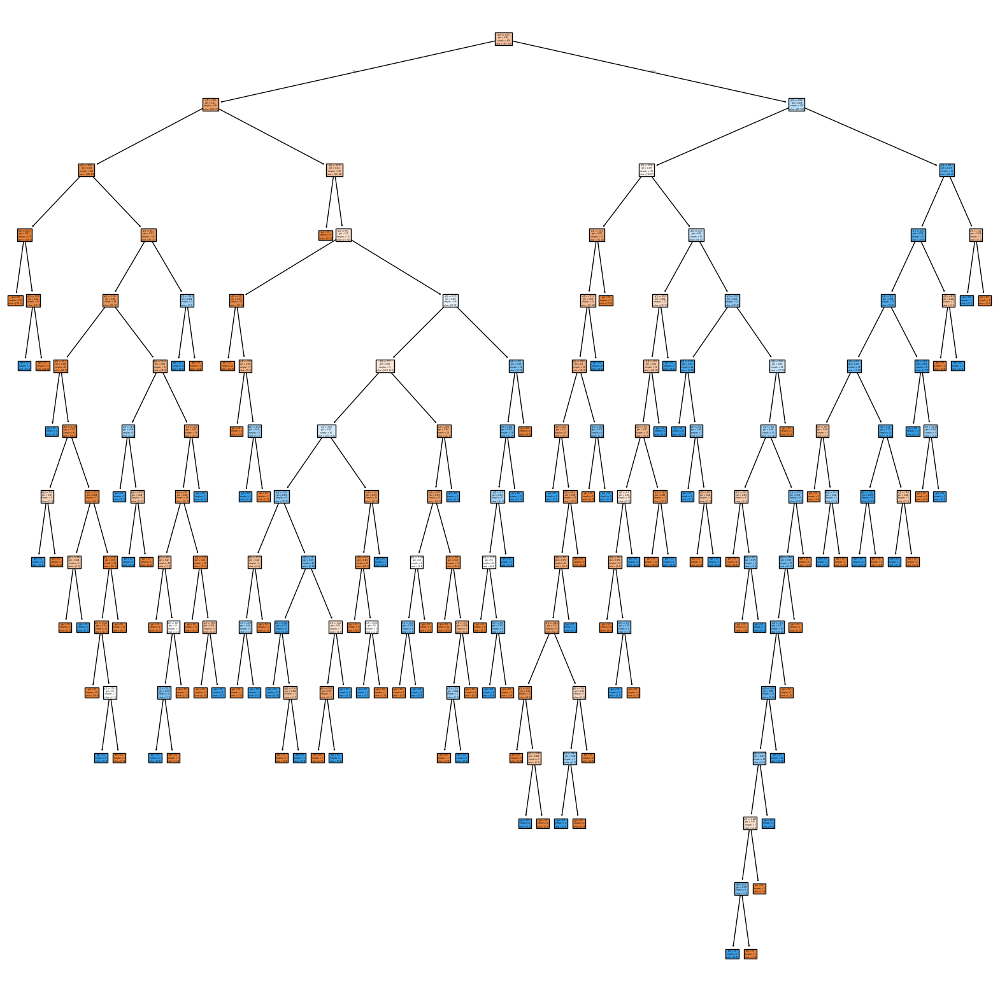

In [290]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

---

### Above tree dont show its values of the Nodes because more node 
    then used to the minimum number of the dataset to plot the Decision Tree 

In [295]:
df2=df.head(30)

In [297]:
x1=df2.drop(columns='Outcome')

In [299]:
y1=df2.Outcome

In [301]:
x1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,30.5,33.6,0.627,50
1,1,85,66,29,30.5,26.6,0.351,31
2,8,183,64,23,30.5,23.3,0.672,32
3,1,89,66,23,94.0,28.1,0.167,21
4,0,137,40,35,168.0,43.1,2.288,33
5,5,116,74,23,30.5,25.6,0.201,30
6,3,78,50,32,88.0,31.0,0.248,26
7,10,115,72,23,30.5,35.3,0.134,29
8,2,197,70,45,543.0,30.5,0.158,53
9,8,125,96,23,30.5,32.0,0.232,54


In [303]:
y1

0     1
1     0
2     1
3     0
4     1
5     0
6     1
7     0
8     1
9     1
10    0
11    1
12    0
13    1
14    1
15    1
16    1
17    1
18    0
19    1
20    0
21    0
22    1
23    1
24    1
25    1
26    1
27    0
28    0
29    0
Name: Outcome, dtype: int64

### Build the model

In [306]:
dt_model_1=DecisionTreeClassifier()

In [337]:
dt_model_1.fit(x1,y1)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


### Plot the model

[Text(0.4230769230769231, 0.9, 'x[1] <= 117.5\ngini = 0.48\nsamples = 30\nvalue = [12, 18]'),
 Text(0.15384615384615385, 0.7, 'x[6] <= 0.225\ngini = 0.426\nsamples = 13\nvalue = [9, 4]'),
 Text(0.28846153846153844, 0.8, 'True  '),
 Text(0.07692307692307693, 0.5, 'gini = 0.0\nsamples = 5\nvalue = [5, 0]'),
 Text(0.23076923076923078, 0.5, 'x[2] <= 79.0\ngini = 0.5\nsamples = 8\nvalue = [4, 4]'),
 Text(0.15384615384615385, 0.3, 'x[5] <= 28.1\ngini = 0.444\nsamples = 6\nvalue = [2, 4]'),
 Text(0.07692307692307693, 0.1, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Text(0.23076923076923078, 0.1, 'gini = 0.0\nsamples = 4\nvalue = [0, 4]'),
 Text(0.3076923076923077, 0.3, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Text(0.6923076923076923, 0.7, 'x[6] <= 0.688\ngini = 0.291\nsamples = 17\nvalue = [3, 14]'),
 Text(0.5576923076923077, 0.8, '  False'),
 Text(0.5384615384615384, 0.5, 'x[0] <= 12.0\ngini = 0.133\nsamples = 14\nvalue = [1, 13]'),
 Text(0.46153846153846156, 0.3, 'gini = 0.0\nsamples =

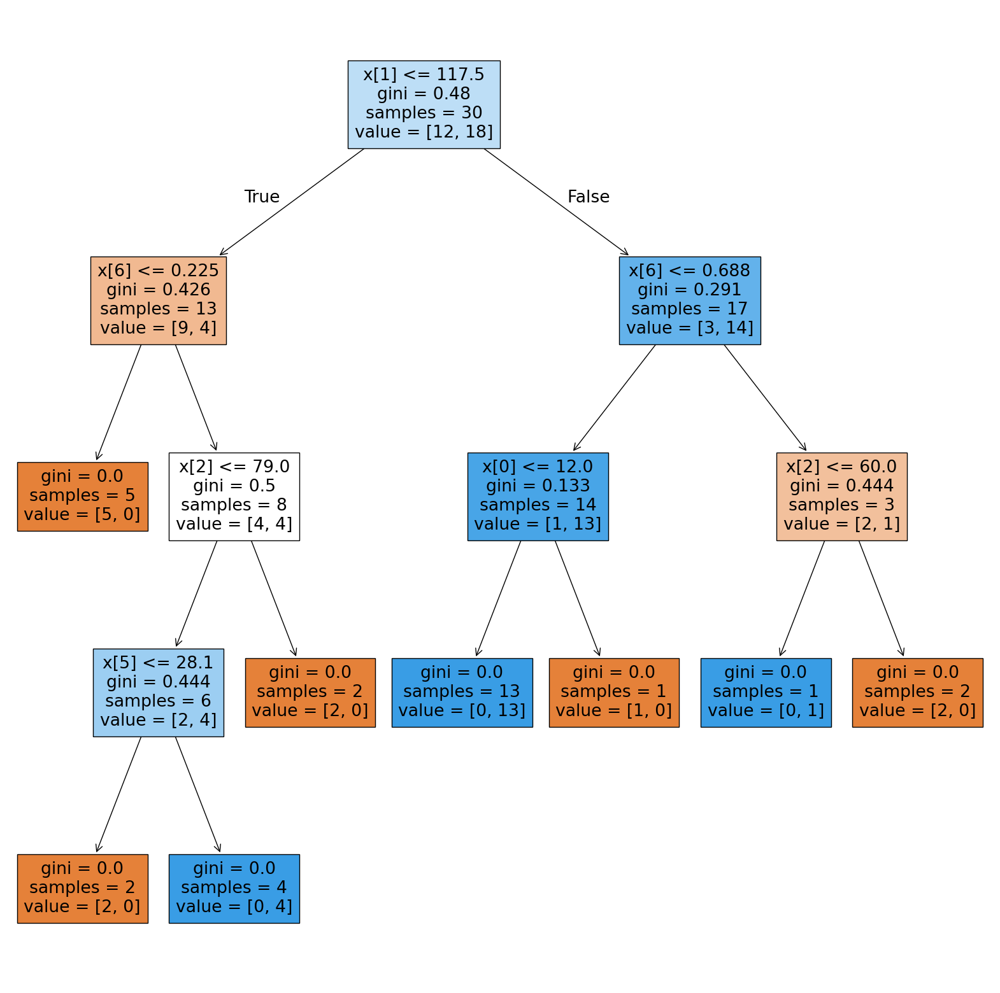

In [340]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

## Above tree shows all of the values clearly

## In my first Model (dt_model) using the whole dataset

In [318]:
param_grid = {
    'max_depth': [3, 4, 5, 6, 7, None],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['gini', 'entropy']
}

In [ ]:
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid,cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
grid_search.fit(X_train, y_train)

### Now some of the pruning

In [321]:
path=dt_model.cost_complexity_pruning_path(x_train,y_train)

In [323]:
path

{'ccp_alphas': array([0.        , 0.00107974, 0.00144389, 0.00148515, 0.00150015,
        0.00155849, 0.00156492, 0.00160433, 0.0016363 , 0.00199068,
        0.0020002 , 0.0020077 , 0.00204848, 0.00204961, 0.00220022,
        0.00220022, 0.00220022, 0.00220022, 0.00220022, 0.00220022,
        0.00220022, 0.00220022, 0.00220022, 0.00234112, 0.00247525,
        0.00247525, 0.00247525, 0.00247525, 0.00250025, 0.00252327,
        0.00264026, 0.00288779, 0.00294098, 0.00299696, 0.0030003 ,
        0.00301744, 0.00318246, 0.00323919, 0.00327533, 0.00330033,
        0.00367936, 0.00391781, 0.00399977, 0.00405749, 0.0040801 ,
        0.00569581, 0.00597825, 0.00708886, 0.013788  , 0.01585584,
        0.01615416, 0.02227979, 0.02257433, 0.08179385]),
 'impurities': array([0.        , 0.00323921, 0.006127  , 0.0090973 , 0.0120976 ,
        0.01521458, 0.01834442, 0.02155308, 0.02482567, 0.0307977 ,
        0.0367983 , 0.0448291 , 0.05097454, 0.05917298, 0.0613732 ,
        0.06577364, 0.06797386

In [327]:
ccp_alpha=path.ccp_alphas

In [333]:
ccp_alpha

array([0.        , 0.00107974, 0.00144389, 0.00148515, 0.00150015,
       0.00155849, 0.00156492, 0.00160433, 0.0016363 , 0.00199068,
       0.0020002 , 0.0020077 , 0.00204848, 0.00204961, 0.00220022,
       0.00220022, 0.00220022, 0.00220022, 0.00220022, 0.00220022,
       0.00220022, 0.00220022, 0.00220022, 0.00234112, 0.00247525,
       0.00247525, 0.00247525, 0.00247525, 0.00250025, 0.00252327,
       0.00264026, 0.00288779, 0.00294098, 0.00299696, 0.0030003 ,
       0.00301744, 0.00318246, 0.00323919, 0.00327533, 0.00330033,
       0.00367936, 0.00391781, 0.00399977, 0.00405749, 0.0040801 ,
       0.00569581, 0.00597825, 0.00708886, 0.013788  , 0.01585584,
       0.01615416, 0.02227979, 0.02257433, 0.08179385])

In [342]:
dt_model_2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x_train,y_train)
    dt_model_2.append(dt_m)

In [344]:
dt_model_2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0010797376033899674),
 DecisionTreeClassifier(ccp_alpha=0.0014438943894389438),
 DecisionTreeClassifier(ccp_alpha=0.0014851485148514856),
 DecisionTreeClassifier(ccp_alpha=0.0015001500150015003),
 DecisionTreeClassifier(ccp_alpha=0.0015584891822515588),
 DecisionTreeClassifier(ccp_alpha=0.0015649225741287609),
 DecisionTreeClassifier(ccp_alpha=0.0016043270993766048),
 DecisionTreeClassifier(ccp_alpha=0.0016362980835898737),
 DecisionTreeClassifier(ccp_alpha=0.0019906752580019908),
 DecisionTreeClassifier(ccp_alpha=0.002000200020002),
 DecisionTreeClassifier(ccp_alpha=0.0020077007700770077),
 DecisionTreeClassifier(ccp_alpha=0.0020484807101399786),
 DecisionTreeClassifier(ccp_alpha=0.00204960972287705),
 DecisionTreeClassifier(ccp_alpha=0.002200220022002198),
 DecisionTreeClassifier(ccp_alpha=0.0022002200220022),
 DecisionTreeClassifier(ccp_alpha=0.0022002200220022),
 DecisionTreeClassifier(ccp_alpha=0.0022002200220022),
 De

In [348]:
train_score=[i.score(x_train,y_train) for i in dt_model_2]
test_score=[i.score(x_test,y_test) for i in dt_model_2]

In [352]:
print(train_score)

[1.0, 0.9983498349834984, 0.9983498349834984, 0.995049504950495, 0.995049504950495, 0.9933993399339934, 0.9917491749174917, 0.9900990099009901, 0.9884488448844885, 0.9851485148514851, 0.9818481848184818, 0.976897689768977, 0.9735973597359736, 0.9686468646864687, 0.966996699669967, 0.9455445544554455, 0.9488448844884488, 0.9504950495049505, 0.9488448844884488, 0.9488448844884488, 0.9488448844884488, 0.9504950495049505, 0.9488448844884488, 0.9438943894389439, 0.933993399339934, 0.9372937293729373, 0.933993399339934, 0.9356435643564357, 0.933993399339934, 0.9257425742574258, 0.9356435643564357, 0.9323432343234324, 0.9273927392739274, 0.9125412541254125, 0.9108910891089109, 0.9108910891089109, 0.900990099009901, 0.8976897689768977, 0.8910891089108911, 0.8828382838283828, 0.8778877887788779, 0.8745874587458746, 0.8564356435643564, 0.8564356435643564, 0.8432343234323433, 0.834983498349835, 0.8250825082508251, 0.8250825082508251, 0.7557755775577558, 0.7458745874587459, 0.7458745874587459, 0.7

In [354]:
print(test_score)

[0.6790123456790124, 0.6975308641975309, 0.6728395061728395, 0.6419753086419753, 0.6604938271604939, 0.6790123456790124, 0.6728395061728395, 0.6728395061728395, 0.6728395061728395, 0.6728395061728395, 0.6851851851851852, 0.6790123456790124, 0.6666666666666666, 0.6728395061728395, 0.6975308641975309, 0.6975308641975309, 0.6728395061728395, 0.691358024691358, 0.7098765432098766, 0.6851851851851852, 0.6790123456790124, 0.6790123456790124, 0.6728395061728395, 0.7098765432098766, 0.7037037037037037, 0.7037037037037037, 0.7098765432098766, 0.7098765432098766, 0.7037037037037037, 0.7037037037037037, 0.7160493827160493, 0.7037037037037037, 0.7098765432098766, 0.7098765432098766, 0.7283950617283951, 0.7222222222222222, 0.7098765432098766, 0.7345679012345679, 0.7407407407407407, 0.7283950617283951, 0.7345679012345679, 0.7407407407407407, 0.7345679012345679, 0.7345679012345679, 0.7345679012345679, 0.7407407407407407, 0.7592592592592593, 0.7592592592592593, 0.654320987654321, 0.7037037037037037, 0

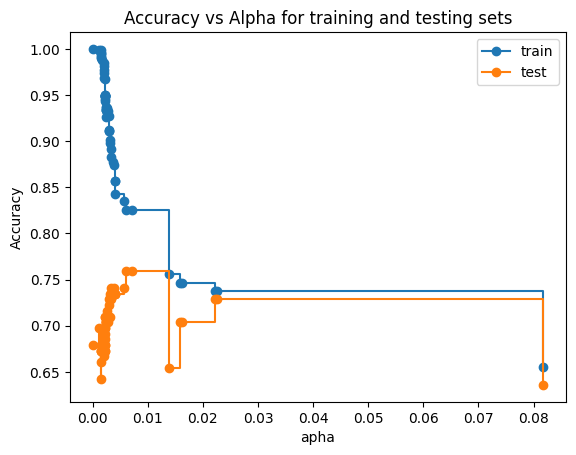

In [356]:
fig,ax=plt.subplots()
ax.set_xlabel("apha")
ax.set_ylabel("Accuracy")
ax.set_title("Accuracy vs Alpha for training and testing sets")
ax.plot(ccp_alpha,train_score,marker='o',label="train",drawstyle='steps-post')
ax.plot(ccp_alpha,test_score,marker='o',label="test",drawstyle='steps-post')
ax.legend()
plt.show()

### Now Building the model with the help of ccp values"

In [364]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.02)

In [366]:
dt_model_ccp.fit(x_train,y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [368]:
dt_model_ccp.score(x_train,y_train)

0.7458745874587459

In [370]:
dt_model_ccp.score(x_test,y_test)

0.7037037037037037

### Plot the Tree on this model 

[Text(0.5, 0.8333333333333334, 'x[1] <= 127.5\ngini = 0.452\nsamples = 606\nvalue = [397, 209]'),
 Text(0.25, 0.5, 'x[7] <= 28.5\ngini = 0.312\nsamples = 388\nvalue = [313, 75]'),
 Text(0.375, 0.6666666666666667, 'True  '),
 Text(0.125, 0.16666666666666666, 'gini = 0.143\nsamples = 220\nvalue = [203, 17]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.452\nsamples = 168\nvalue = [110, 58]'),
 Text(0.75, 0.5, 'x[1] <= 159.5\ngini = 0.474\nsamples = 218\nvalue = [84, 134]'),
 Text(0.625, 0.6666666666666667, '  False'),
 Text(0.625, 0.16666666666666666, 'gini = 0.499\nsamples = 139\nvalue = [72, 67]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.258\nsamples = 79\nvalue = [12, 67]')]

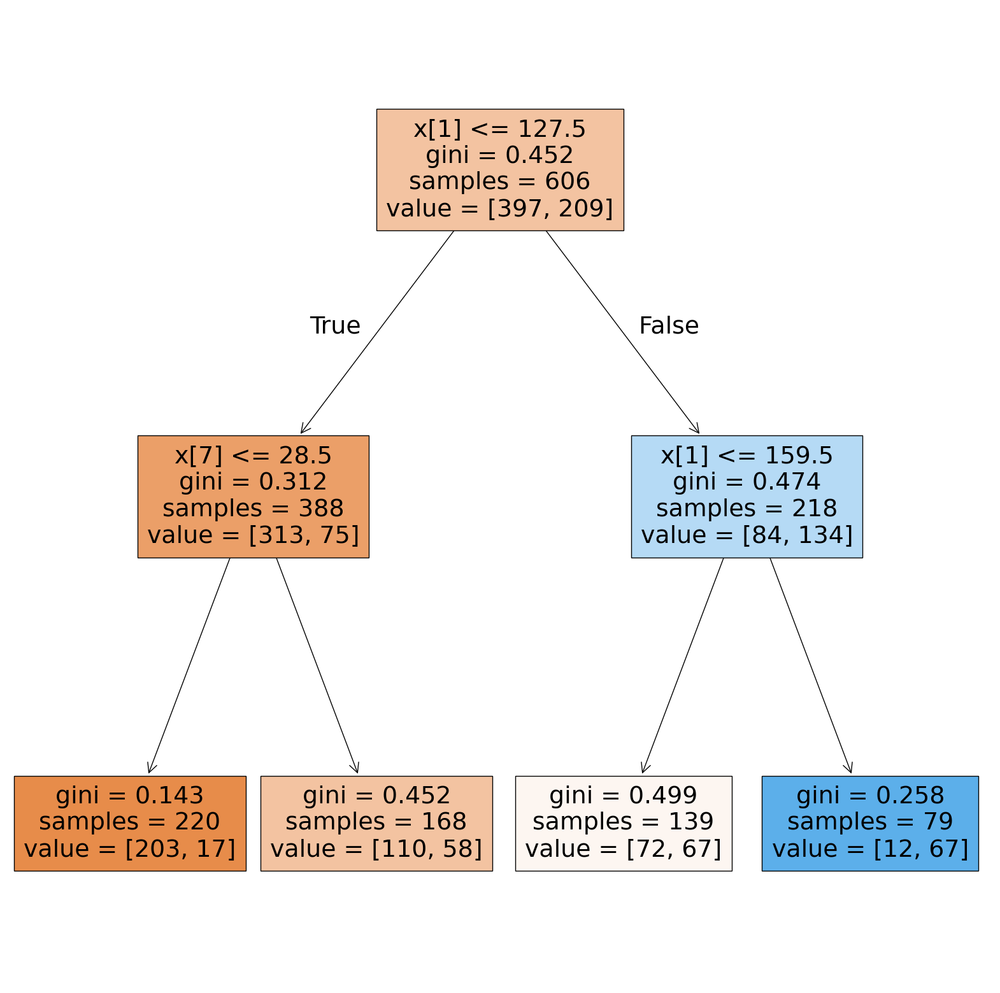

In [382]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

### Here the model training and testing almost same

### In the privious only find the ccp_alpha paramer values, but here find the more parametr actual values

## Using GridSeachCV

In [384]:
grid_params = {
    'max_depth': [3, 4, 5, 6, 7, None],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['gini', 'entropy'],
    'ccp_alpha': [0.0, 0.01, 0.02, 0.05] 
}

In [386]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_params, verbose=2,cv=5, scoring='accuracy', n_jobs=-1)

In [388]:
grid_ccp.fit(x_train,y_train)

Fitting 5 folds for each of 768 candidates, totalling 3840 fits


,estimator,DecisionTreeC...andom_state=0)
,param_grid,"{'ccp_alpha': [0.0, 0.01, ...], 'criterion': ['gini', 'entropy'], 'max_depth': [3, 4, ...], 'min_samples_leaf': [1, 2, ...], ...}"
,scoring,'accuracy'
,n_jobs,-1
,refit,True
,cv,5
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,criterion,'gini'


# Best parameters & accuracy

In [395]:
print("Best Parameters:", grid_ccp.best_params_)
print("Train Accuracy:", grid_ccp.best_estimator_.score(x_train, y_train))
print("Test Accuracy:", grid_ccp.best_estimator_.score(x_test, y_test))

Best Parameters: {'ccp_alpha': 0.01, 'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 5, 'min_samples_split': 2}
Train Accuracy: 0.7871287128712872
Test Accuracy: 0.7222222222222222


## Based on this parameter Build the Decision Tree Model

In [403]:
final_model=DecisionTreeClassifier(ccp_alpha=0.01,criterion='gini',max_depth=4,min_samples_leaf=5,min_samples_split=2,random_state=42)

In [405]:
final_model.fit(x_train,y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,4
,min_samples_split,2
,min_samples_leaf,5
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [407]:
final_model.score(x_test,y_test)

0.7222222222222222

In [409]:
final_model.score(x_train,y_train)

0.7871287128712872

### plot the Tree

[Text(0.5, 0.9, 'x[1] <= 127.5\ngini = 0.452\nsamples = 606\nvalue = [397, 209]'),
 Text(0.2, 0.7, 'x[7] <= 28.5\ngini = 0.312\nsamples = 388\nvalue = [313, 75]'),
 Text(0.35, 0.8, 'True  '),
 Text(0.1, 0.5, 'gini = 0.143\nsamples = 220\nvalue = [203, 17]'),
 Text(0.3, 0.5, 'x[5] <= 26.35\ngini = 0.452\nsamples = 168\nvalue = [110, 58]'),
 Text(0.2, 0.3, 'gini = 0.0\nsamples = 33\nvalue = [33, 0]'),
 Text(0.4, 0.3, 'x[1] <= 94.5\ngini = 0.49\nsamples = 135\nvalue = [77, 58]'),
 Text(0.3, 0.1, 'gini = 0.128\nsamples = 29\nvalue = [27, 2]'),
 Text(0.5, 0.1, 'gini = 0.498\nsamples = 106\nvalue = [50, 56]'),
 Text(0.8, 0.7, 'x[1] <= 159.5\ngini = 0.474\nsamples = 218\nvalue = [84, 134]'),
 Text(0.65, 0.8, '  False'),
 Text(0.7, 0.5, 'x[5] <= 29.95\ngini = 0.499\nsamples = 139\nvalue = [72, 67]'),
 Text(0.6, 0.3, 'gini = 0.351\nsamples = 44\nvalue = [34, 10]'),
 Text(0.8, 0.3, 'gini = 0.48\nsamples = 95\nvalue = [38, 57]'),
 Text(0.9, 0.5, 'gini = 0.258\nsamples = 79\nvalue = [12, 67]')]

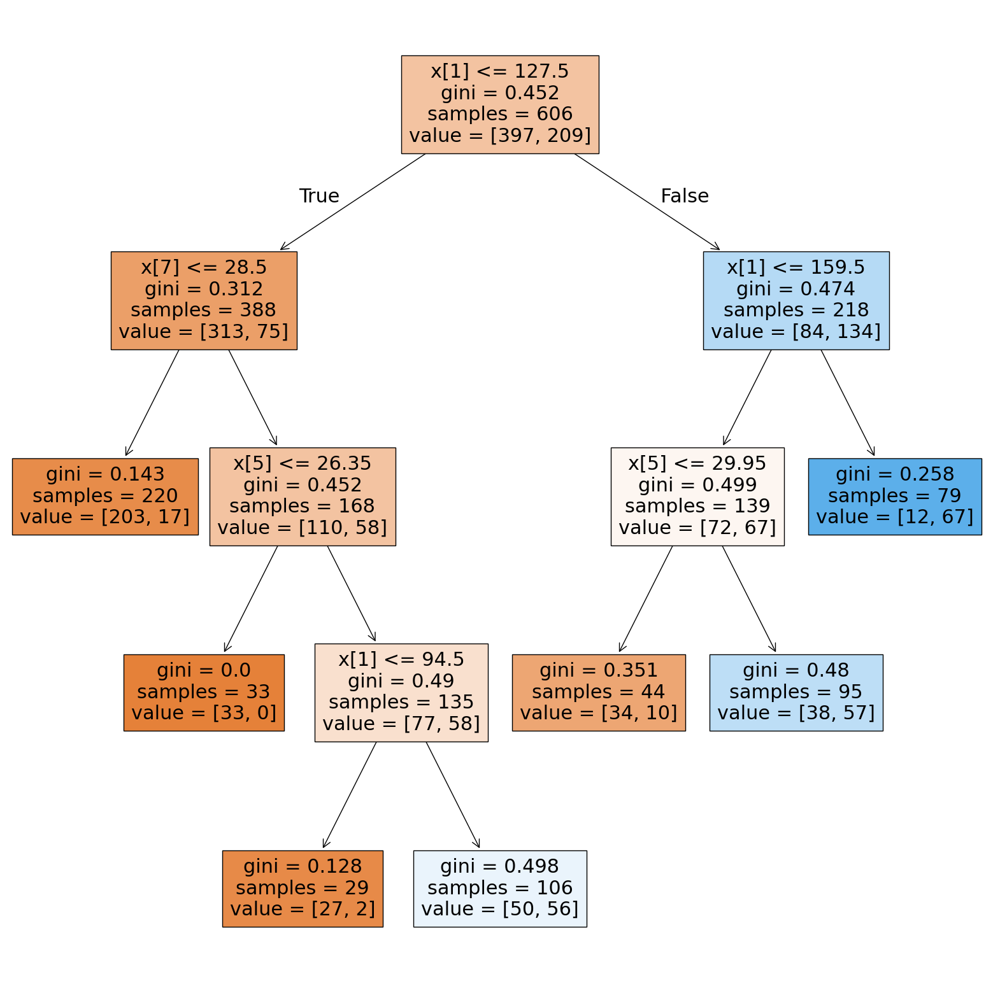

In [413]:
plt.figure(figsize=(20,20))
tree.plot_tree(final_model,filled=True)

In [415]:
y_pred = final_model.predict(x_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.7222222222222222
[[69 34]
 [11 48]]
              precision    recall  f1-score   support

           0       0.86      0.67      0.75       103
           1       0.59      0.81      0.68        59

    accuracy                           0.72       162
   macro avg       0.72      0.74      0.72       162
weighted avg       0.76      0.72      0.73       162



### check which Feature is importance or not

In [434]:
import pandas as pd

feature_importance = pd.DataFrame({
    'Feature': x.columns,
    'Importance': final_model.feature_importances_}).sort_values(by='Importance', ascending=False)

print(feature_importance)


                    Feature  Importance
1                   Glucose    0.695461
5                       BMI    0.173632
7                       Age    0.130907
0               Pregnancies    0.000000
2             BloodPressure    0.000000
3             SkinThickness    0.000000
4                   Insulin    0.000000
6  DiabetesPedigreeFunction    0.000000


### ROC-AUC Score & Curve

AUC: 0.797186111568208


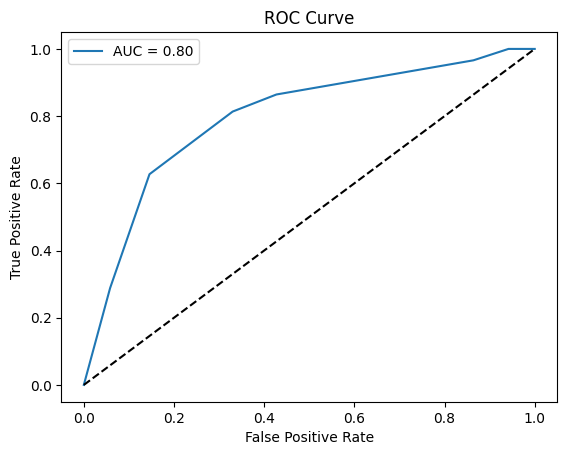

In [437]:
# Predicted probabilities
y_probs = final_model.predict_proba(x_test)[:,1]

# AUC
auc = roc_auc_score(y_test, y_probs)
print("AUC:", auc)

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

## Cross-validation Accuracy

In [441]:
cv_scores = cross_val_score(final_model, x, y, cv=5, scoring='accuracy')
print("CV Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())

CV Scores: [0.74025974 0.66233766 0.76623377 0.77777778 0.7254902 ]
Mean CV Accuracy: 0.7344198285374757


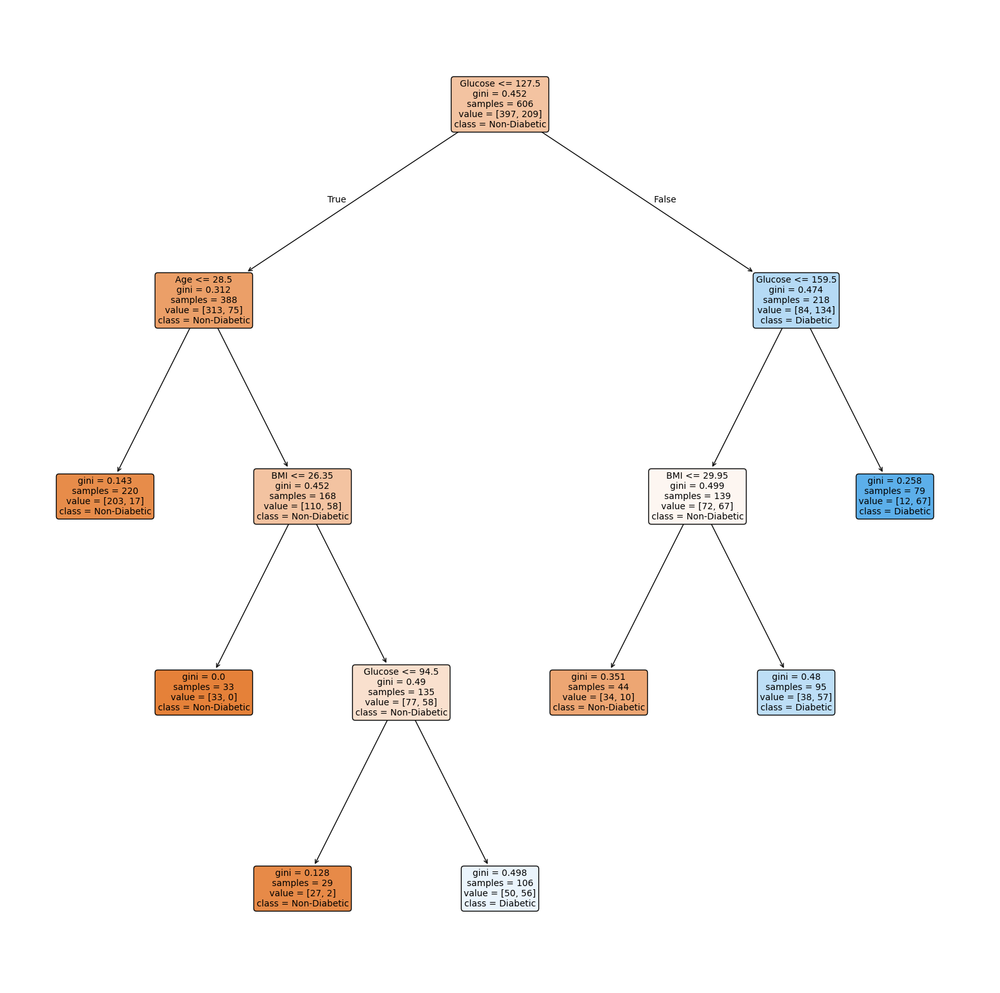

In [447]:
plt.figure(figsize=(20,20)) 
plot_tree(final_model,
          feature_names=x.columns,
          class_names=['Non-Diabetic','Diabetic'],
          filled=True,   
          rounded=True,  
          fontsize=10)
plt.show()


### save the model

In [451]:
import joblib
joblib.dump(final_model, "pima_diabetes_predictor.pkl")

['pima_diabetes_predictor.pkl']